In [6]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from naplab.naplab_dataset import NaplabDataset
from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_retrieval,
    pairs_from_exhaustive
)
from hloc import colmap_from_nvm, triangulation, localize_sfm, visualization
import pycolmap
from pycolmap import (
    Reconstruction
)
from hloc.utils import viz_3d
import os
import hloc.reconstruction
from database import COLMAPDatabase

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
nap = NaplabDataset("./Trip094/gnss094_50.txt", "./Trip094/gnss094_52.txt", fps=1, rig_json_path="./Trip094/nobadcam.json", n = 30)
nap.create_nerfstudio_dataset("nerfstudio")

Cam 0 | Image Saving Batch 0 completed
Cam 1 | Image Saving Batch 0 completed
Cam 2 | Image Saving Batch 0 completed
Transforms JSON created at nerfstudio/transforms.json


In [8]:
images = Path("nerfstudio/images")

outputs = Path("outputs/sfm/")
sfm_pairs = outputs / "pairs-netvlad.txt"
sfm_dir = outputs / "sfm_superpoint+superglue"

retrieval_conf = extract_features.confs["netvlad"]
feature_conf = extract_features.confs["superpoint_aachen"]
matcher_conf = match_features.confs["superglue"]

In [9]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=10)
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(
    matcher_conf, sfm_pairs, feature_conf["output"], outputs
)
#model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2024/05/14 19:20:45 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2024/05/14 19:20:45 hloc INFO] Found 96 images in root nerfstudio/images.


100%|██████████| 96/96 [00:06<00:00, 13.94it/s]
[2024/05/14 19:20:59 hloc INFO] Finished exporting features.
[2024/05/14 19:20:59 hloc INFO] Extracting image pairs from a retrieval database.
[2024/05/14 19:21:00 hloc INFO] Found 960 pairs.
[2024/05/14 19:21:00 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2024/05/14 19:21:00 hloc INFO] Found 96 images in root nerfstudio/images.


Loaded SuperPoint model


100%|██████████| 96/96 [00:04<00:00, 21.35it/s]
[2024/05/14 19:21:04 hloc INFO] Finished exporting features.
[2024/05/14 19:21:04 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 573/573 [00:50<00:00, 11.28it/s]
[2024/05/14 19:21:55 hloc INFO] Finished exporting matches.


In [10]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2024/05/14 19:21:55 hloc INFO] Creating an empty database...
[2024/05/14 19:21:55 hloc INFO] Importing images into the database...


[2024/05/14 19:21:59 hloc INFO] Importing features into the database...
100%|██████████| 96/96 [00:00<00:00, 1384.74it/s]
[2024/05/14 19:21:59 hloc INFO] Importing matches into the database...
100%|██████████| 960/960 [00:00<00:00, 1695.67it/s]
[2024/05/14 19:22:00 hloc INFO] Performing geometric verification of the matches...
I20240514 19:22:00.289312 534313 misc.cc:198] 
Custom feature matching
I20240514 19:22:00.291040 534313 feature_matching.cc:1034] Matching block [1/1]
I20240514 19:22:40.903640 534313 feature_matching.cc:47]  in 40.613s
I20240514 19:22:40.909201 534313 timer.cc:91] Elapsed time: 0.677 [minutes]
[2024/05/14 19:22:40 hloc INFO] Running 3D reconstruction...
I20240514 19:22:40.934093 531827 incremental_mapper.cc:225] Loading database
I20240514 19:22:40.934947 531827 database_cache.cc:65] Loading cameras...
I20240514 19:22:40.935055 531827 database_cache.cc:75]  96 in 0.000s
I20240514 19:22:40.935070 531827 database_cache.cc:83] Loading matches...
I20240514 19:22:40.9

In [13]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping", points_rgb=True)
fig.show()

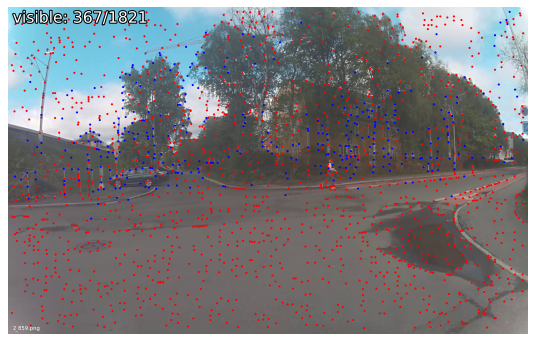

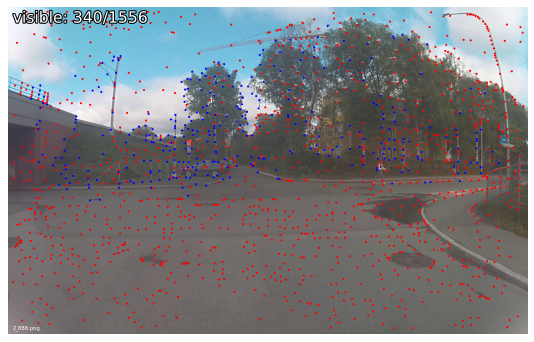

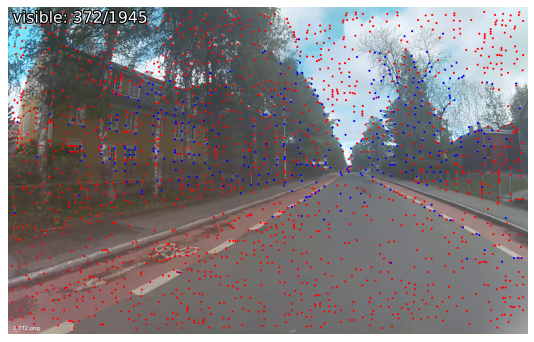

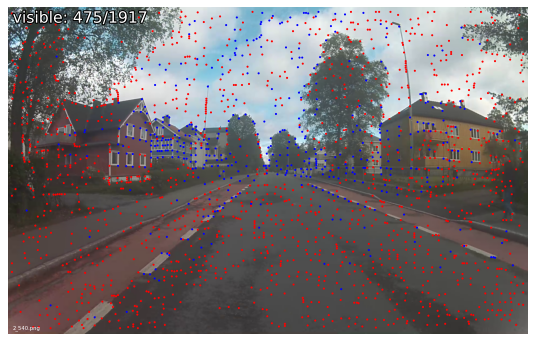

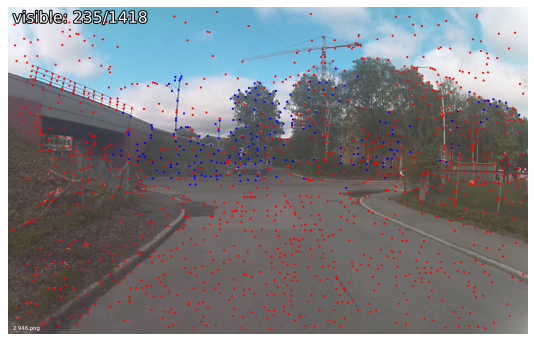

...

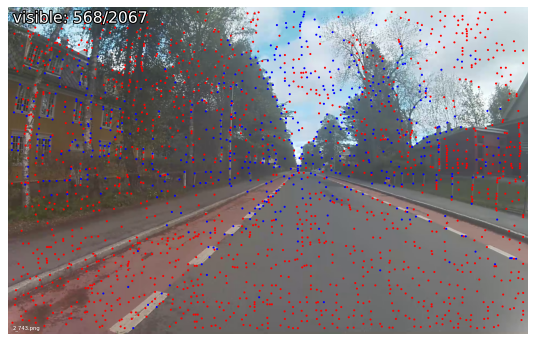

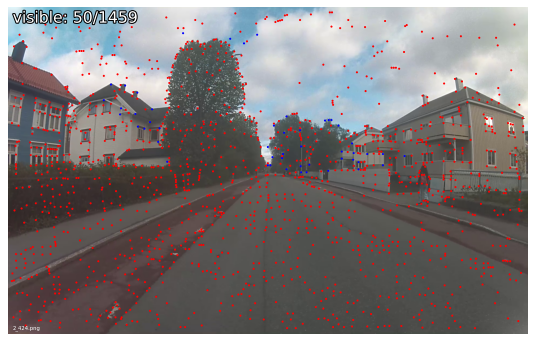

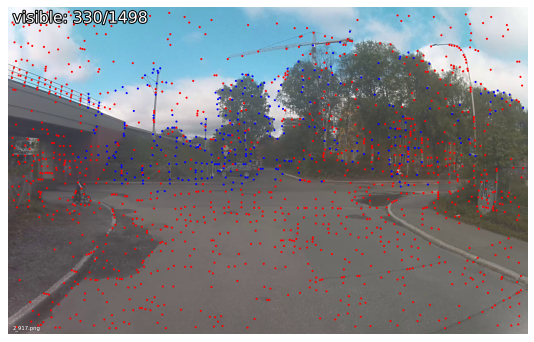

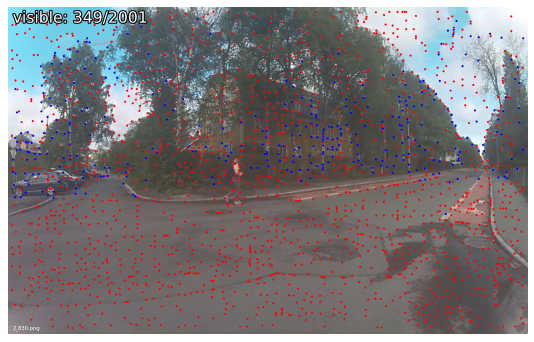

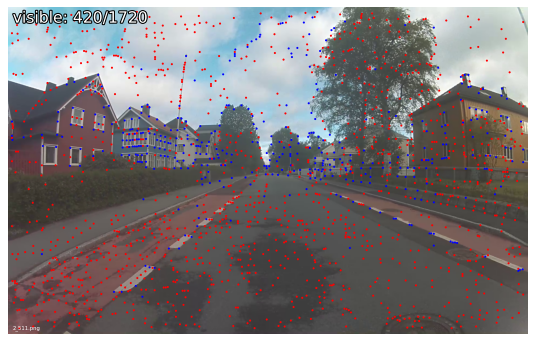

In [12]:
visualization.visualize_sfm_2d(model, images, color_by="visibility", n=19)